<h2>Congreso COMIA-Taller</h2>

### Análisis exploratorio 

In [43]:
#Librerias
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd
#from tabulate import tabulate

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib.ticker as ticker
import seaborn as sns

# Preprocesado y modelado
# ==============================================================================
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.neighbors import KNeighborsClassifier
#from sklearn.datasets import make_blobs
#from sklearn.metrics import euclidean_distances
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Ridge

#from skopt.space import Real, Integer
#from skopt.utils import use_named_args
#from skopt import gp_minimize
#from skopt.plots import plot_convergence

# Varios
# ==============================================================================
import multiprocessing
import random
#from itertools import product
from fitter import Fitter, get_common_distributions
import warnings
warnings.filterwarnings('ignore')

### Describiendo los datos

In [32]:
municipios=pd.read_csv("base_de_datos_municipio.csv")
municipios. describe()


,Code_INEGI,Code_ent,ANUIES_Education,ANUIES_Arts and Humanities,ANUIES_social sciences and law,ANUIES_Business Administration,"ANUIES_natural sciences, mathematics and statistics",ANUIES_Technology of the information and communication,"ANUIES_Engineering, manufacturing and construction",ANUIES_Health Sciences,...,CONAPO_IM_2020,conteo_aeropuertos,pasajeros_2019,vuelos_2019,eci_2015,eci_2016,eci_2017,eci_2018,eci_2019,eci_2020
count,2469.000000,2469.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,...,2469.000000,2469.000000,2.325000e+03,2325.000000,2.457000e+03,2.458000e+03,2.458000e+03,2.460000e+03,2.465000e+03,2.465000e+03
mean,19324.164844,19.215472,781.056389,613.406491,1081.141582,1453.639757,577.090467,372.536714,1371.806491,1779.095740,...,53.914893,29.810450,1.676826e+06,15928.155269,-1.417823e-12,-1.500384e-12,1.550799e-12,-1.642394e-11,5.570540e-13,5.149702e-12
std,7382.892458,7.367340,1704.071235,1489.648938,3847.549010,4453.635273,1193.285436,941.696037,3067.907332,3601.102472,...,3.904466,33.139087,3.033649e+06,24040.792994,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,1001.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.000000,...,21.364695,1.000000,1.300000e+02,5.000000,-1.821059e+00,-1.921988e+00,-1.926144e+00,-1.918949e+00,-1.919250e+00,-1.856838e+00
25%,14079.000000,14.000000,102.000000,41.000000,59.000000,107.000000,101.000000,54.000000,100.000000,184.000000,...,51.808532,7.000000,3.705500e+05,4605.000000,-7.206566e-01,-7.128905e-01,-7.130126e-01,-7.092096e-01,-7.195233e-01,-7.200062e-01
50%,20226.000000,20.000000,259.000000,130.000000,167.000000,354.000000,170.000000,165.000000,499.000000,367.000000,...,54.382600,20.000000,9.428350e+05,10117.000000,-1.925492e-01,-1.915197e-01,-1.878584e-01,-1.892878e-01,-1.879801e-01,-1.965637e-01
75%,24027.000000,24.000000,521.000000,420.000000,501.000000,932.000000,422.000000,341.000000,1209.000000,1481.000000,...,56.655284,34.000000,1.244091e+06,15289.000000,4.547682e-01,4.528017e-01,4.520223e-01,4.516503e-01,4.843976e-01,4.611754e-01
max,32058.000000,32.000000,16151.000000,13076.000000,62079.000000,58921.000000,16950.000000,13864.000000,35476.000000,33720.000000,...,62.356110,136.000000,2.512915e+07,210863.000000,3.774324e+00,3.700553e+00,3.683763e+00,3.710049e+00,3.525857e+00,3.610880e+00


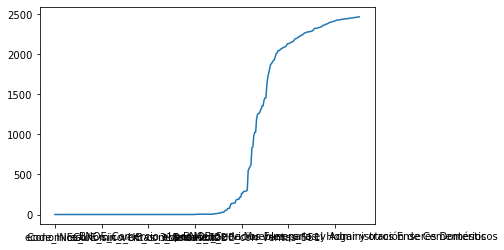

In [33]:
total_nan=municipios.isnull().sum(axis = 0)
total_nan.to_csv("Total_Nan.csv")
#total_nan
total_nan=total_nan.sort_values()
total_nan
total_nan.plot()

In [34]:
#perimitiremos un porcentaje de missing value 
total_nan=pd.read_csv("Total_Nan.csv")
total_nan=total_nan.rename(columns={'Unnamed: 0':"columna",'0':"conteo_na"})
total_nan.columns
total_nan=total_nan[total_nan["conteo_na"]>2450]
columnas=total_nan["columna"].to_list()
municipios=municipios.drop(columns=columnas)

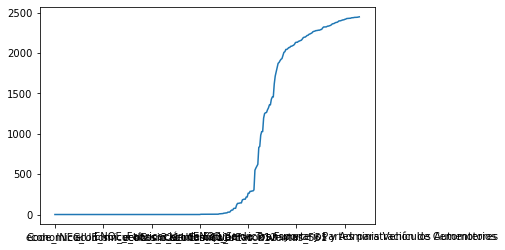

In [35]:
#Aca quedan las variables que tienen mas del 25% de los datos
#se van 118 variables de 
total_nan=municipios.isnull().sum(axis = 0)
total_nan=total_nan.sort_values()
total_nan.plot()

In [36]:
#Guardando base limpia
municipios.to_csv("base_de_datos_municipio_limpia_todo.csv",index=False)

In [37]:
municipios.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2469 entries, 0 to 2468
Columns: 316 entries, Code_INEGI to eci_2020
dtypes: float64(166), int64(148), object(2)
memory usage: 6.0+ MB


### Como se ve el ECI

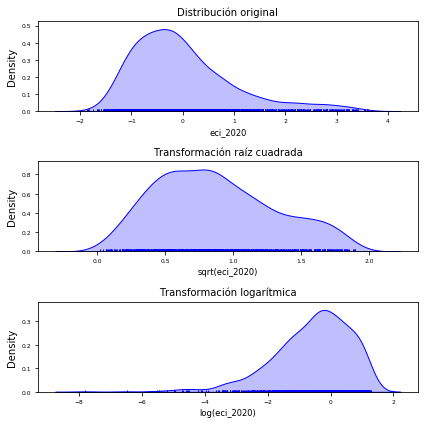

In [51]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(6, 6))
sns.distplot(
    municipios.eci_2020,
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[0]
)
axes[0].set_title("Distribución original", fontsize = 'medium')
axes[0].set_xlabel('eci_2020', fontsize='small') 
axes[0].tick_params(labelsize = 6)

sns.distplot(
    np.sqrt(municipios.eci_2020),
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[1]
)
axes[1].set_title("Transformación raíz cuadrada", fontsize = 'medium')
axes[1].set_xlabel('sqrt(eci_2020)', fontsize='small') 
axes[1].tick_params(labelsize = 6)

sns.distplot(
    np.log(municipios.eci_2020),
    hist    = False,
    rug     = True,
    color   = "blue",
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = axes[2]
)
axes[2].set_title("Transformación logarítmica", fontsize = 'medium')
axes[2].set_xlabel('log(eci_2020)', fontsize='small') 
axes[2].tick_params(labelsize = 6)

fig.tight_layout()

In [40]:
# me traigo las variables numericas y las describo
municipios.select_dtypes(include=['float64', 'int']).describe()

,Code_INEGI,Code_ent,ANUIES_Education,ANUIES_Arts and Humanities,ANUIES_social sciences and law,ANUIES_Business Administration,"ANUIES_natural sciences, mathematics and statistics",ANUIES_Technology of the information and communication,"ANUIES_Engineering, manufacturing and construction",ANUIES_Health Sciences,...,CONAPO_IM_2020,conteo_aeropuertos,pasajeros_2019,vuelos_2019,eci_2015,eci_2016,eci_2017,eci_2018,eci_2019,eci_2020
count,2469.000000,2469.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,...,2469.000000,2469.000000,2.325000e+03,2325.000000,2.457000e+03,2.458000e+03,2.458000e+03,2.460000e+03,2.465000e+03,2.465000e+03
mean,19324.164844,19.215472,781.056389,613.406491,1081.141582,1453.639757,577.090467,372.536714,1371.806491,1779.095740,...,53.914893,29.810450,1.676826e+06,15928.155269,-1.417823e-12,-1.500384e-12,1.550799e-12,-1.642394e-11,5.570540e-13,5.149702e-12
std,7382.892458,7.367340,1704.071235,1489.648938,3847.549010,4453.635273,1193.285436,941.696037,3067.907332,3601.102472,...,3.904466,33.139087,3.033649e+06,24040.792994,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,1001.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.000000,...,21.364695,1.000000,1.300000e+02,5.000000,-1.821059e+00,-1.921988e+00,-1.926144e+00,-1.918949e+00,-1.919250e+00,-1.856838e+00
25%,14079.000000,14.000000,102.000000,41.000000,59.000000,107.000000,101.000000,54.000000,100.000000,184.000000,...,51.808532,7.000000,3.705500e+05,4605.000000,-7.206566e-01,-7.128905e-01,-7.130126e-01,-7.092096e-01,-7.195233e-01,-7.200062e-01
50%,20226.000000,20.000000,259.000000,130.000000,167.000000,354.000000,170.000000,165.000000,499.000000,367.000000,...,54.382600,20.000000,9.428350e+05,10117.000000,-1.925492e-01,-1.915197e-01,-1.878584e-01,-1.892878e-01,-1.879801e-01,-1.965637e-01
75%,24027.000000,24.000000,521.000000,420.000000,501.000000,932.000000,422.000000,341.000000,1209.000000,1481.000000,...,56.655284,34.000000,1.244091e+06,15289.000000,4.547682e-01,4.528017e-01,4.520223e-01,4.516503e-01,4.843976e-01,4.611754e-01
max,32058.000000,32.000000,16151.000000,13076.000000,62079.000000,58921.000000,16950.000000,13864.000000,35476.000000,33720.000000,...,62.356110,136.000000,2.512915e+07,210863.000000,3.774324e+00,3.700553e+00,3.683763e+00,3.710049e+00,3.525857e+00,3.610880e+00


### graficando la distribucion de las chentamil variables

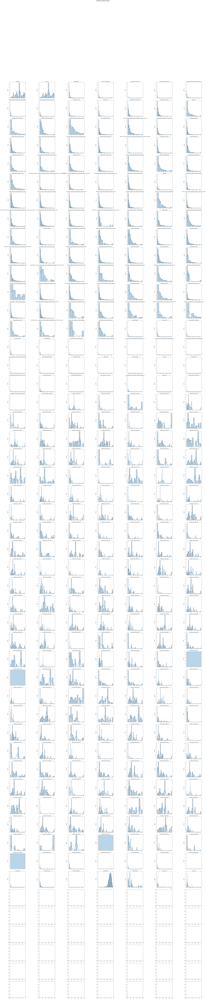

In [49]:

fig, axes = plt.subplots(nrows=50, ncols=7, figsize=(40,200))
axes = axes.flat
columnas_numeric = municipios.select_dtypes(include=['float64', 'int']).columns
#quito las variables respuesta
columnas_numeric = columnas_numeric.drop(["eci_2015","eci_2016","eci_2017","eci_2018","eci_2019","eci_2020"])

for i, colum in enumerate(columnas_numeric):
    sns.histplot(
        data    = municipios,
        x       = colum,
        stat    = "count",
        kde     = True,
        #color   = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
        line_kws= {'linewidth': 2},
        alpha   = 0.3,
        ax      = axes[i]
    )
    axes[i].set_title(colum, fontsize = 7, fontweight = "bold")
    axes[i].tick_params(labelsize = 6)
    axes[i].set_xlabel("")
    
    
fig.tight_layout()
plt.subplots_adjust(top = 0.9)
fig.suptitle('Distribución variables numéricas', fontsize = 10, fontweight = "bold")

plt.savefig('distribucion_variables_municipales.png')

### graficando respecto al ECI 2020

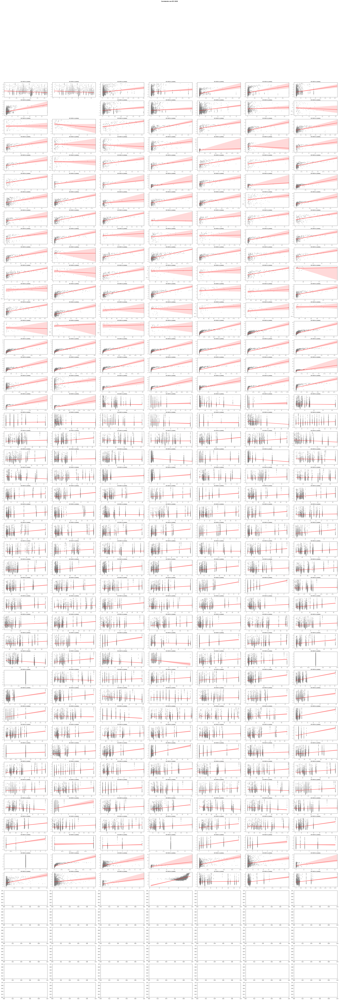

In [45]:
# Gráfico de distribución para cada variable numérica
# ==============================================================================
# Ajustar número de subplots en función del número de columnas
fig, axes = plt.subplots(nrows=50, ncols=7, figsize=(40,120))
axes = axes.flat
columnas_numeric = municipios.select_dtypes(include=['float64', 'int']).columns
columnas_numeric = columnas_numeric.drop(["eci_2015","eci_2016","eci_2017","eci_2018","eci_2019","eci_2020"])

for i, colum in enumerate(columnas_numeric):
    sns.regplot(
        x           = municipios[colum],
        y           = municipios['eci_2020'],
        color       = "gray",
        marker      = '.',
        scatter_kws = {"alpha":0.4},
        line_kws    = {"color":"r","alpha":0.7},
        ax          = axes[i]
    )
    axes[i].set_title("ECI 2019 vs {colum}", fontsize = 7, fontweight = "bold")
    #axes[i].ticklabel_format(style='sci', scilimits=(-4,4), axis='both')
    axes[i].yaxis.set_major_formatter(ticker.EngFormatter())
    axes[i].xaxis.set_major_formatter(ticker.EngFormatter())
    axes[i].tick_params(labelsize = 6)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")

# Se eliminan los axes vacíos
for i in [8]:
    fig.delaxes(axes[i])
    
fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Correlación con ECI 2020', fontsize = 10, fontweight = "bold")
plt.savefig('correlacion_de_variables_municipales_con_ECI.png')

### Correlaciones

In [46]:
def tidy_corr_matrix(corr_mat):
    '''
    Función para convertir una matrix de correlación de pandas en formato tidy
    '''
    corr_mat = corr_mat.stack().reset_index()
    corr_mat.columns = ['variable_1','variable_2','r']
    corr_mat = corr_mat.loc[corr_mat['variable_1'] != corr_mat['variable_2'], :]
    corr_mat['abs_r'] = np.abs(corr_mat['r'])
    corr_mat = corr_mat.sort_values('abs_r', ascending=False)
    
    return(corr_mat)



corr_matrix = municipios.select_dtypes(include=['float64', 'int']).corr(method='pearson')
tidy_corr_matrix(corr_matrix).head(10)

,variable_1,variable_2,r,abs_r
49877,economico_UE_con_ventas_325,economico_UE_con_ventas_482,1.0,1.0
88803,economico_UE_con_ventas_482,economico_UE_con_ventas_325,1.0,1.0
88588,economico_UE_sin_ventas_482,economico_UE_con_ventas_533,1.0,1.0
77467,economico_UE_sin_ventas_533,economico_UE_con_ventas_482,1.0,1.0
88892,economico_UE_con_ventas_482,economico_UE_sin_ventas_533,1.0,1.0
77776,economico_UE_con_ventas_533,economico_UE_sin_ventas_482,1.0,1.0
88587,economico_UE_sin_ventas_482,economico_UE_sin_ventas_533,1.0,1.0
88416,economico_UE_sin_ventas_482,"ENOE_Casinos, Loterías y otros Juegos de Azar",1.0,1.0
88893,economico_UE_con_ventas_482,economico_UE_con_ventas_533,1.0,1.0
77777,economico_UE_con_ventas_533,economico_UE_con_ventas_482,1.0,1.0


In [47]:
#la guardamos
corr_matrix.to_csv("Matriz_correlacion.csv")

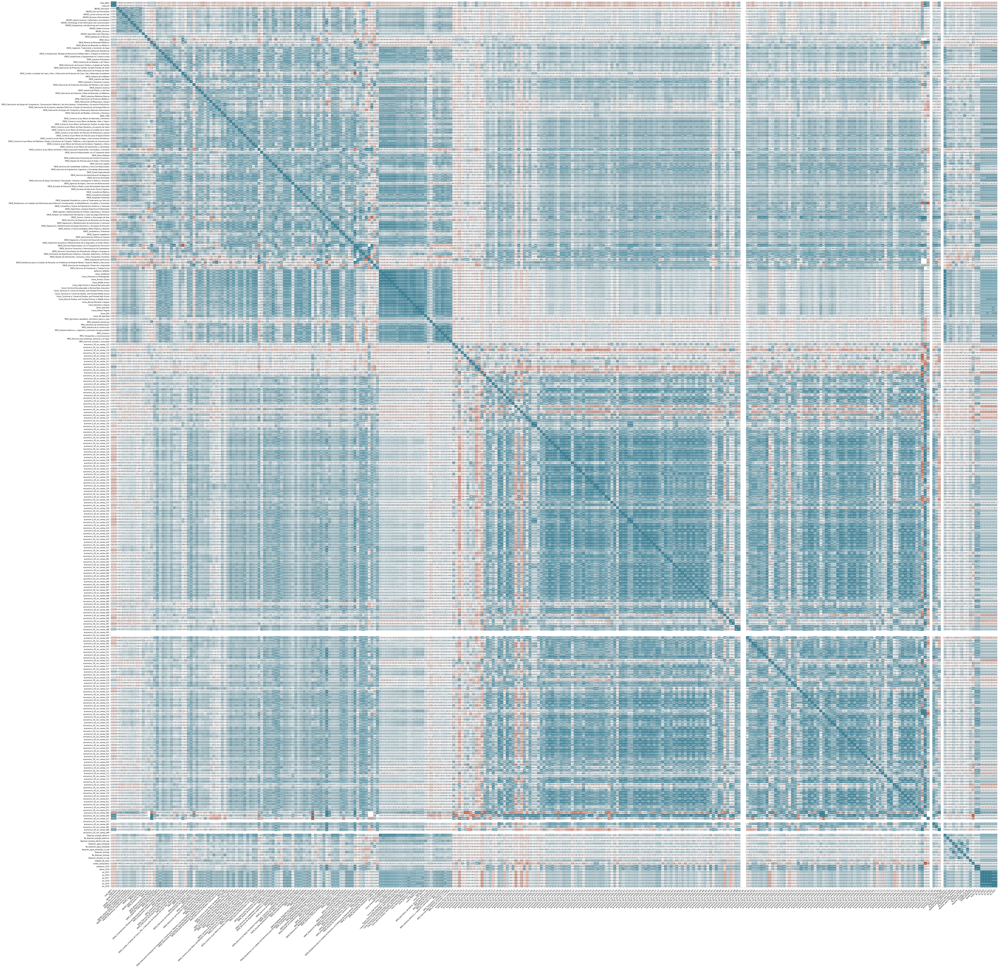

In [48]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(80, 80))

sns.heatmap(
    corr_matrix,
    annot     = True,
    cbar      = False,
    annot_kws = {"size": 6},
    vmin      = -1,
    vmax      = 1,
    center    = 0,
    cmap      = sns.diverging_palette(20, 220, n=200),
    square    = True,
    ax        = ax
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right',
)


ax.tick_params(labelsize = 8)
plt.savefig('Matriz_de_correlaciones.png')